In [1]:
import pandas as pd
pd.set_option('display.max_columns', 100)
import numpy as np
import os
import pandas_profiling as pp
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from time import time
from sklearn import metrics as sklm
from sklearn.metrics import roc_curve, auc
from matplotlib import pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# Data overview

In [2]:
DATA_PATH='data/winequality-red.csv'

In [3]:
df=pd.read_csv(DATA_PATH)
df.sample(20)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
553,5.0,1.040,0.24,1.60,0.050,32.0,96.0,0.99340,3.74,0.62,11.5,5
19,7.9,0.320,0.51,1.80,0.341,17.0,56.0,0.99690,3.04,1.08,9.2,6
910,9.3,0.380,0.48,3.80,0.132,3.0,11.0,0.99577,3.23,0.57,13.2,6
430,10.5,0.240,0.47,2.10,0.066,6.0,24.0,0.99780,3.15,0.90,11.0,7
215,7.0,0.490,0.49,5.60,0.060,26.0,121.0,0.99740,3.34,0.76,10.5,5
570,11.5,0.350,0.49,3.30,0.070,10.0,37.0,1.00030,3.32,0.91,11.0,6
1163,9.0,0.785,0.24,1.70,0.078,10.0,21.0,0.99692,3.29,0.67,10.0,5
1443,6.9,0.580,0.20,1.75,0.058,8.0,22.0,0.99322,3.38,0.49,11.7,5
446,12.5,0.380,0.60,2.60,0.081,31.0,72.0,0.99960,3.10,0.73,10.5,5
1361,8.3,0.850,0.14,2.50,0.093,13.0,54.0,0.99724,3.36,0.54,10.1,5


In [4]:
df.describe(include='all')

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [5]:
# df.drop_duplicates(inplace=True)
# df.shape

In [6]:
df['quality'].value_counts()

5    681
6    638
7    199
4     53
8     18
3     10
Name: quality, dtype: int64

In [7]:
report = pp.ProfileReport(df)
report.to_notebook_iframe()

# Data processing

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [9]:
df['label']=df['quality'].apply(lambda x: 'good' if x >=6 else 'bad')
df.sample(10)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,label
578,8.8,0.47,0.49,2.9,0.085,17.0,110.0,0.99820,3.29,0.60,9.8,5,bad
680,13.3,0.43,0.58,1.9,0.070,15.0,40.0,1.00040,3.06,0.49,9.0,5,bad
841,6.6,0.66,0.00,3.0,0.115,21.0,31.0,0.99629,3.45,0.63,10.3,5,bad
1070,9.3,0.33,0.45,1.5,0.057,19.0,37.0,0.99498,3.18,0.89,11.1,7,good
1378,7.2,0.45,0.15,2.0,0.078,10.0,28.0,0.99609,3.29,0.51,9.9,6,good
1363,8.0,0.83,0.27,2.0,0.080,11.0,63.0,0.99652,3.29,0.48,9.8,4,bad
1319,9.1,0.76,0.68,1.7,0.414,18.0,64.0,0.99652,2.90,1.33,9.1,6,good
928,8.6,0.47,0.27,2.3,0.055,14.0,28.0,0.99516,3.18,0.80,11.2,5,bad
455,11.3,0.62,0.67,5.2,0.086,6.0,19.0,0.99880,3.22,0.69,13.4,8,good
1400,7.9,0.69,0.21,2.1,0.080,33.0,141.0,0.99620,3.25,0.51,9.9,5,bad


In [10]:
np_data=df.to_numpy()
X=np_data[:, :-2]
Y=np_data[:, -1]
print(X.shape, Y.shape)
print(Y)

(1599, 11) (1599,)
['bad' 'bad' 'bad' ... 'good' 'bad' 'good']


In [11]:
# train test split: 30% for testing
x_train, x_test, y_train, y_test=train_test_split(X, Y, test_size=0.3, random_state=42)
print(x_train.shape, y_train.shape, x_test.shape, y_test.shape)

(1119, 11) (1119,) (480, 11) (480,)


# Metrics

In [12]:
def evaluate(clf, x, labels, roc=True):
    scores=clf.predict_proba(x)[:, 0]
    scores2=clf.predict(x)
    
    print('Classification report:')
    report = sklm.classification_report(labels, scores2)
    print(report)

    # print confusion matrix
    conf = sklm.confusion_matrix(labels, scores2)
    print('Confusion matrix:')
    print(conf)

#     # plot confusion matrix
#     n_conf=sklm.confusion_matrix(labels, scores2, normalize='true')
#     df_conf = pd.DataFrame(conf, index = ['Actual:Negative', 'Actual: Positive'],
#                     columns = ['Predicted: Negative', 'Predicted: Positve'])
#     plt.figure(figsize = (5,5))
#     sns.heatmap(df_conf, annot=True, fmt='.2f')
#     plt.show()

    # ROC curve and AUC score 
    fpr, tpr, thresholds = roc_curve(labels, scores, pos_label = clf.classes_[0])
    plt.figure()
    lw = 2
    plt.plot(fpr, tpr, color='darkorange',
            lw=lw, label='ROC curve (area = %0.2f)' % auc(fpr, tpr))
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) curve')
    plt.legend(loc="lower right")
    plt.show()

# Training decision tree classifier

## Simple decision tree with depth=3

Classification report:
              precision    recall  f1-score   support

         bad       0.67      0.53      0.59       213
        good       0.68      0.79      0.73       267

    accuracy                           0.68       480
   macro avg       0.67      0.66      0.66       480
weighted avg       0.67      0.68      0.67       480

Confusion matrix:
[[113 100]
 [ 56 211]]


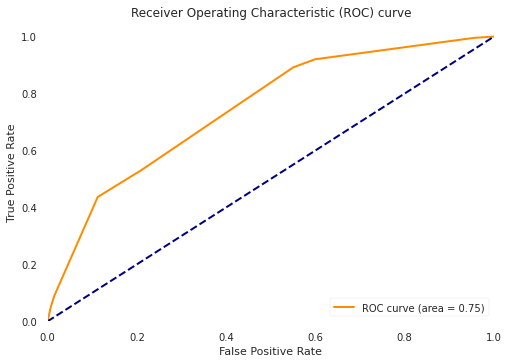

In [13]:
clf=DecisionTreeClassifier(criterion='entropy', max_depth=3, min_samples_leaf=5)
clf.fit(x_train, y_train)
clf.score(x_test, y_test)
evaluate(clf, x_test, y_test)

## Visualize trained decision tree

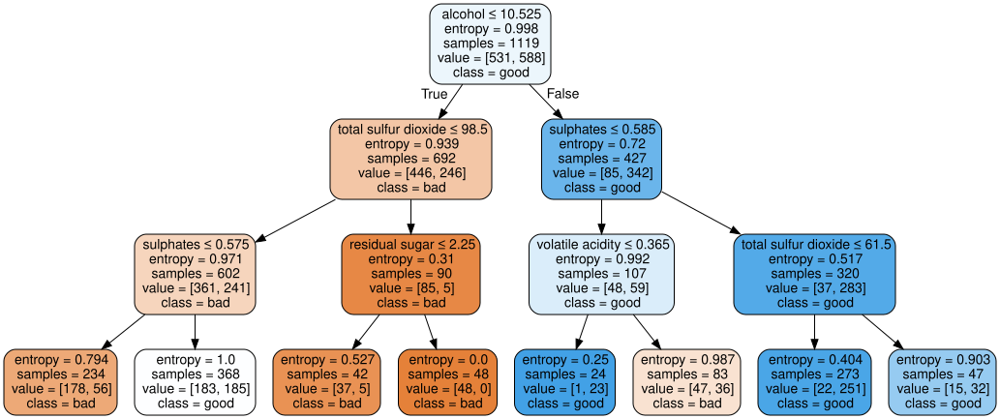

In [14]:
import graphviz
from sklearn.tree import export_graphviz
FEATURES=list(df.columns)[:-2]
dot_data = export_graphviz(clf, out_file=None, feature_names= FEATURES,
                                class_names=clf.classes_,  filled=True, rounded=True,  special_characters=True)  
graph = graphviz.Source(dot_data)  
graph

# Grid search to find best hyper parameters

In [15]:
params={
    'criterion': ('gini', 'entropy'),
    'max_depth':(3, 4, 5, 6, 7, 8),
    'min_samples_leaf': (3, 5, 9, 13, 19)
}

In [16]:
def grid_search(pipeline, parameters, x_train, y_train):
    # find the best parameters for both the feature extraction and the classifier
    grid_searcher = GridSearchCV(pipeline, parameters, cv=3, n_jobs=-1,  verbose=10 )
    print("Performing grid search...")
    print("parameters:")
    print(parameters)
    t0 = time()
    grid_searcher.fit(x_train, y_train)
    print("done in %0.3fs" % (time() - t0))
    print("Best score: %0.3f" % grid_searcher.best_score_)
    print("Best parameters set:")
    best_estimator=grid_searcher.best_estimator_
    best_parameters = best_estimator.get_params()
    print(best_parameters)
    cv_results=pd.DataFrame(grid_searcher.cv_results_).sort_values(by='rank_test_score')
    return cv_results, best_estimator

In [17]:
clf=DecisionTreeClassifier()
cv_results, best_tree=grid_search(clf, params, x_train, y_train)

Performing grid search...
parameters:
{'criterion': ('gini', 'entropy'), 'max_depth': (3, 4, 5, 6, 7, 8), 'min_samples_leaf': (3, 5, 9, 13, 19)}
Fitting 3 folds for each of 60 candidates, totalling 180 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1228s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0497s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0818s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1558s.) Setting batch_size=16.
[Parallel(n_jobs=-1)]: Done 107 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 130 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 141 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    0.8s


done in 0.952s
Best score: 0.736
Best parameters set:
{'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'entropy', 'max_depth': 5, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 19, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'presort': 'deprecated', 'random_state': None, 'splitter': 'best'}


[Parallel(n_jobs=-1)]: Done 165 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 180 out of 180 | elapsed:    0.9s finished


In [18]:
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
44,0.005272,0.000818,0.003341,0.002094,entropy,5,19,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.718499,0.718499,0.772118,0.736372,0.025276,1
9,0.006130,0.002110,0.001488,0.000053,gini,4,19,"{'criterion': 'gini', 'max_depth': 4, 'min_sam...",0.699732,0.737265,0.764075,0.733691,0.026389,2
39,0.006795,0.001354,0.001541,0.000060,entropy,4,19,"{'criterion': 'entropy', 'max_depth': 4, 'min_...",0.699732,0.737265,0.764075,0.733691,0.026389,2
13,0.009954,0.003902,0.002134,0.000688,gini,5,13,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.705094,0.726542,0.761394,0.731010,0.023201,4
14,0.011319,0.001602,0.003611,0.002933,gini,5,19,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.718499,0.742627,0.731903,0.731010,0.009871,4
54,0.006166,0.000659,0.001720,0.000197,entropy,7,19,"{'criterion': 'entropy', 'max_depth': 7, 'min_...",0.715818,0.721180,0.747989,0.728329,0.014073,6
59,0.006238,0.000186,0.003072,0.002315,entropy,8,19,"{'criterion': 'entropy', 'max_depth': 8, 'min_...",0.715818,0.721180,0.739946,0.725648,0.010345,7
49,0.006344,0.000638,0.001900,0.000500,entropy,6,19,"{'criterion': 'entropy', 'max_depth': 6, 'min_...",0.718499,0.721180,0.731903,0.723861,0.005792,8
36,0.004907,0.000085,0.001501,0.000097,entropy,4,5,"{'criterion': 'entropy', 'max_depth': 4, 'min_...",0.689008,0.715818,0.764075,0.722967,0.031060,9
52,0.008139,0.000914,0.002613,0.001546,entropy,7,9,"{'criterion': 'entropy', 'max_depth': 7, 'min_...",0.675603,0.747989,0.742627,0.722073,0.032932,10


Classification report:
              precision    recall  f1-score   support

         bad       0.64      0.76      0.69       213
        good       0.77      0.66      0.71       267

    accuracy                           0.70       480
   macro avg       0.70      0.71      0.70       480
weighted avg       0.71      0.70      0.70       480

Confusion matrix:
[[161  52]
 [ 92 175]]


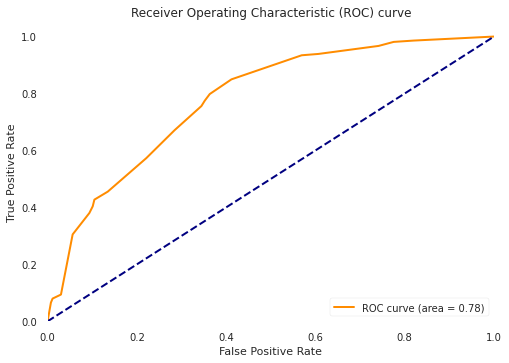

In [19]:
evaluate(best_tree, x_test, y_test)

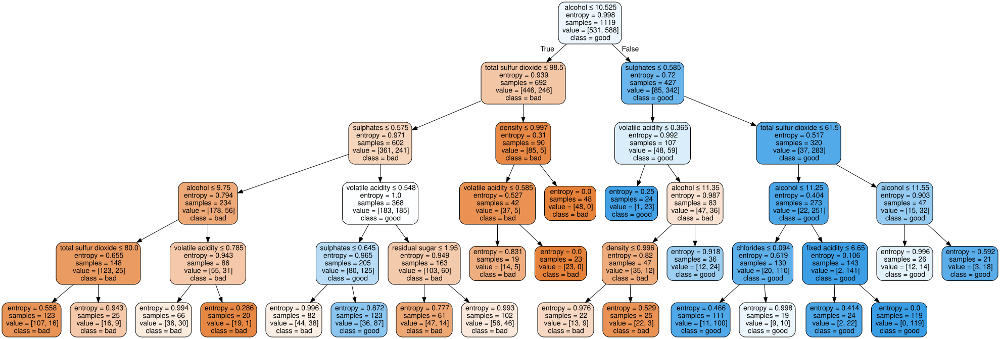

In [20]:
dot_data = export_graphviz(best_tree, out_file=None, feature_names= FEATURES,
                                class_names=best_tree.classes_,  filled=True, rounded=True,  special_characters=True)  
graph = graphviz.Source(dot_data)  
graph

# 2nd tree with depth=4

Classification report:
              precision    recall  f1-score   support

         bad       0.69      0.69      0.69       213
        good       0.75      0.75      0.75       267

    accuracy                           0.72       480
   macro avg       0.72      0.72      0.72       480
weighted avg       0.72      0.72      0.72       480

Confusion matrix:
[[146  67]
 [ 67 200]]


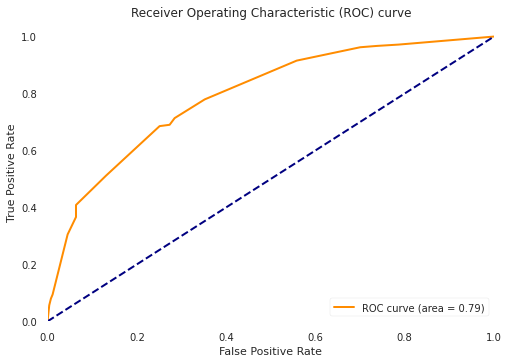

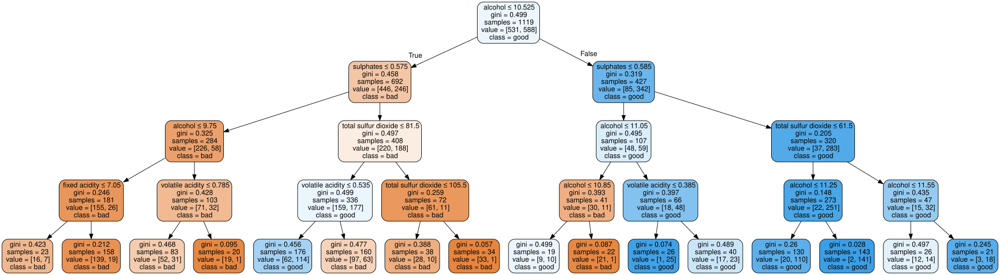

In [21]:
second_tree=DecisionTreeClassifier(criterion='gini', max_depth=4, min_samples_leaf=19)
second_tree.fit(x_train, y_train)
evaluate(second_tree, x_test, y_test)
dot_data = export_graphviz(second_tree, out_file=None, feature_names= FEATURES,
                                class_names=second_tree.classes_,  filled=True, rounded=True,  special_characters=True)  
graph = graphviz.Source(dot_data)  
graph

# Feature importance

In [22]:
from matplotlib import pyplot as plt
f_imp=best_tree.feature_importances_
print(f_imp)

[0.01289948 0.12225188 0.         0.01478642 0.02410553 0.
 0.13391845 0.02346431 0.         0.18581175 0.48276217]


In [23]:
# used and unused features in the above best decision tree
used_f=[i for i in range(len(FEATURES)) if f_imp[i]!=0]
print(used_f)
unused_f=[i for i in range(len(FEATURES)) if f_imp[i]==0]
print(unused_f)

[0, 1, 3, 4, 6, 7, 9, 10]
[2, 5, 8]


[('citric acid', 0.0), ('free sulfur dioxide', 0.0), ('pH', 0.0), ('fixed acidity', 0.012899477399028064), ('residual sugar', 0.014786424792382308), ('density', 0.02346430561695168), ('chlorides', 0.024105534636191285), ('volatile acidity', 0.1222518841249349), ('total sulfur dioxide', 0.13391845329853644), ('sulphates', 0.185811751261226), ('alcohol', 0.4827621688707493)]


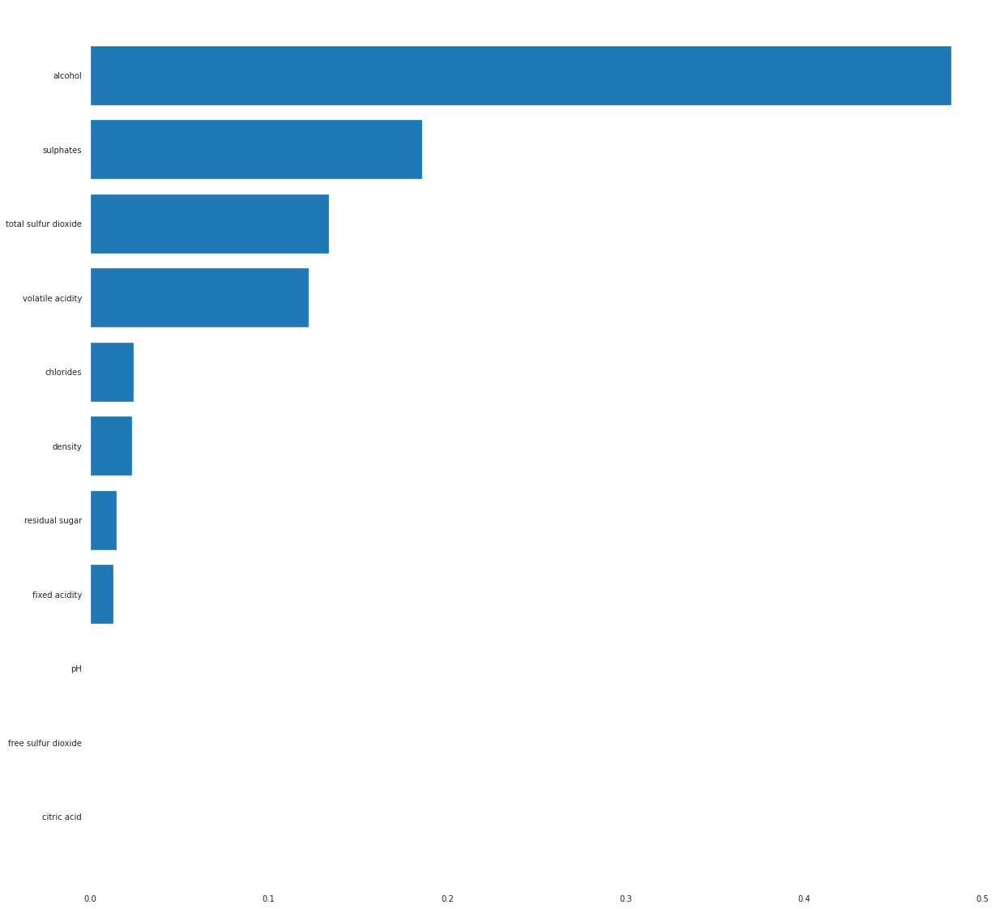

In [24]:
# Plot feature importances
f_imp=[(f, f_imp[i]) for i, f in enumerate(FEATURES)]
f_imp.sort(key=lambda x: x[1])
f_names=[x[0] for x in f_imp]
f_score=[x[1] for x in f_imp]
print(f_imp)
plt.subplots(figsize=(20,20))
plt.barh(np.arange(len(f_score)), f_score, tick_label=f_names)
plt.show()

## Try to retrain the classifier with the same hyper parameters and used features only  
This process should output the exactly same results as best tree founed by gridsearchCV above

In [25]:
x_train_subset=x_train[:, used_f]
x_test_subset=x_test[:, used_f]
clf=DecisionTreeClassifier(criterion='gini', max_depth=4, min_samples_leaf=5)
clf.fit(x_train_subset, y_train)
clf.score(x_test_subset, y_test)

0.7166666666666667

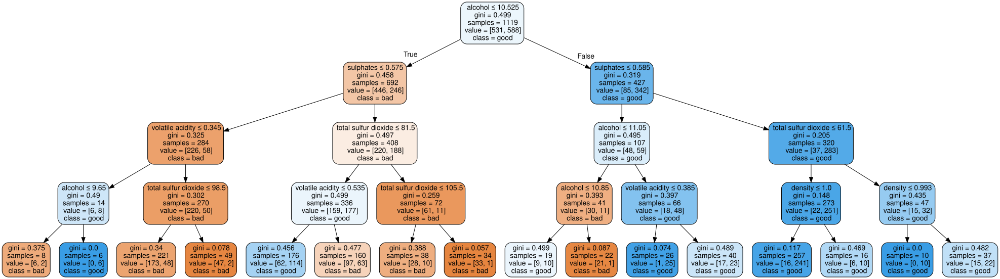

In [26]:
dot_data = export_graphviz(clf, out_file=None, feature_names= np.array(FEATURES)[used_f],
                                class_names=clf.classes_,  filled=True, rounded=True,  special_characters=True)  
graph = graphviz.Source(dot_data)  
graph

Note: Decision graph visualized for this tree is exactly the same as best tree above

## Try to retrain the classifier with unused features
This process may output bad results

In [27]:
x_train_subset=x_train[:, unused_f]
x_test_subset=x_test[:, unused_f]
clf=DecisionTreeClassifier(criterion='gini', max_depth=5, min_samples_leaf=3)
clf.fit(x_train_subset, y_train)
clf.score(x_test_subset, y_test)

0.625

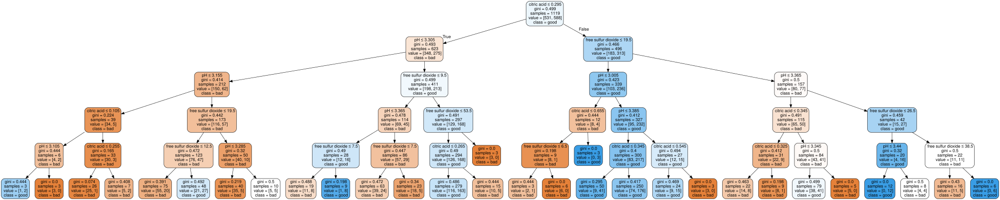

In [28]:
dot_data = export_graphviz(clf, out_file=None, feature_names= np.array(FEATURES)[unused_f],
                                class_names=clf.classes_,  filled=True, rounded=True,  special_characters=True)  
graph = graphviz.Source(dot_data)  
graph

# Reduce number of values on each features

## Qcut

In [29]:
qcut_df=df.iloc[:, :-2 ]
qcut_df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol'],
      dtype='object')

In [30]:
for col in qcut_df.columns:
    print('-----', col)
    qcut_df['pcut']=pd.qcut(qcut_df[col], q=4, labels=['0-25%', '25-50%', '50-75%','75-100%'] )
    groups= qcut_df.groupby('pcut')
    bin_map={}
    for name, g in groups:
        bin_map[name]=g[col].mean()
    
    print(bin_map)
    qcut_df[col]=qcut_df['pcut'].map(bin_map)
del qcut_df['pcut']
qcut_df   

----- fixed acidity
{'0-25%': 6.528400954653937, '25-50%': 7.534760705289673, '50-75%': 8.543927648578812, '75-100%': 10.782575757575756}
----- volatile acidity
{'0-25%': 0.3172783251231527, '25-50%': 0.4586463414634146, '50-75%': 0.5865356265356264, '75-100%': 0.767034574468085}
----- citric acid
{'0-25%': 0.03153846153846154, '25-50%': 0.18909090909090912, '50-75%': 0.3444986449864499, '75-100%': 0.5335175879396985}
----- residual sugar
{'0-25%': 1.7137931034482756, '25-50%': 2.094033412887828, '50-75%': 2.4367036011080336, '75-100%': 4.245915492957747}
----- chlorides
{'0-25%': 0.06043414634146343, '25-50%': 0.07521356783919597, '50-75%': 0.08407594936708859, '75-100%': 0.13115151515151516}
----- free sulfur dioxide
{'0-25%': 5.310049019607843, '25-50%': 10.926940639269406, '50-75%': 17.453521126760563, '75-100%': 30.742462311557787}
----- total sulfur dioxide
{'0-25%': 15.326876513317192, '25-50%': 29.888349514563107, '50-75%': 49.10372340425532, '75-100%': 93.45477386934674}
-----

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.534761,0.767035,0.031538,1.713793,0.075214,10.926941,29.888350,0.997250,3.509044,0.589609,9.327829
1,7.534761,0.767035,0.031538,2.436704,0.131152,30.742462,93.454774,0.997250,3.125142,0.673281,9.882471
2,7.534761,0.767035,0.031538,2.436704,0.131152,17.453521,49.103723,0.997250,3.268643,0.673281,9.882471
3,10.782576,0.317278,0.533518,1.713793,0.075214,17.453521,49.103723,0.999113,3.125142,0.589609,9.882471
4,7.534761,0.767035,0.031538,1.713793,0.075214,10.926941,29.888350,0.997250,3.509044,0.589609,9.327829
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.528401,0.586536,0.031538,2.094033,0.084076,30.742462,49.103723,0.994453,3.509044,0.589609,10.702431
1595,6.528401,0.586536,0.189091,2.094033,0.060434,30.742462,49.103723,0.994453,3.509044,0.883238,11.979781
1596,6.528401,0.458646,0.189091,2.436704,0.075214,30.742462,49.103723,0.996211,3.509044,0.883238,10.702431
1597,6.528401,0.767035,0.189091,2.094033,0.075214,30.742462,49.103723,0.994453,3.509044,0.673281,9.882471


In [31]:
# train test split: 30% for testing
X=qcut_df.to_numpy()
x_train, x_test, y_train, y_test=train_test_split(X, Y, test_size=0.3, random_state=42)
print(x_train.shape, y_train.shape, x_test.shape, y_test.shape)

(1119, 11) (1119,) (480, 11) (480,)


Classification report:
              precision    recall  f1-score   support

         bad       0.64      0.79      0.71       213
        good       0.80      0.65      0.71       267

    accuracy                           0.71       480
   macro avg       0.72      0.72      0.71       480
weighted avg       0.73      0.71      0.71       480

Confusion matrix:
[[169  44]
 [ 94 173]]


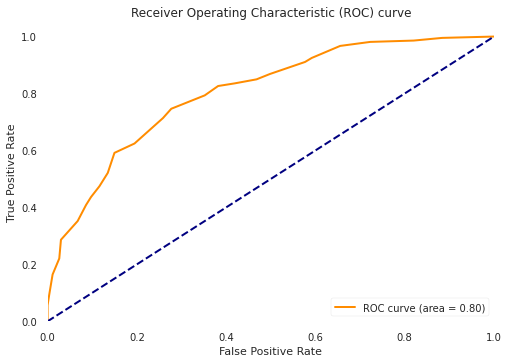

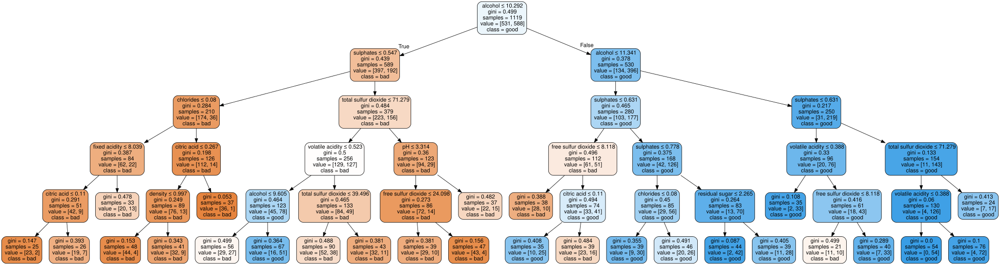

In [32]:
clf=DecisionTreeClassifier(criterion='gini', max_depth=5, min_samples_leaf=19)
clf.fit(x_train, y_train)
evaluate(clf, x_test, y_test)
dot_data = export_graphviz(clf, out_file=None, feature_names= FEATURES,
                                class_names=second_tree.classes_,  filled=True, rounded=True,  special_characters=True)  
graph = graphviz.Source(dot_data)  
graph

## K-means

In [33]:
kmean_df=df.iloc[:, :-2 ]

for col in kmean_df.columns:
    print('-----', col)
    kmean_df['cluster']= KMeans(n_clusters=4).fit(kmean_df[col].to_numpy().reshape(-1, 1)).labels_
    groups= kmean_df.groupby('cluster')
    bin_map={}
    for name, g in groups:
        bin_map[name]=g[col].mean()
        print(f"    cluster {name}: min={g[col].min()}, max={g[col].max()}")
    
    print(bin_map)
    kmean_df[col]=kmean_df['cluster'].map(bin_map)
del kmean_df['cluster']
kmean_df   

----- fixed acidity
    cluster 0: min=9.1, max=11.1
    cluster 1: min=4.6, max=7.4
    cluster 2: min=7.5, max=9.0
    cluster 3: min=11.2, max=15.9
{0: 9.934603174603176, 1: 6.732752613240418, 2: 8.14640410958904, 3: 12.314285714285713}
----- volatile acidity
    cluster 0: min=0.12, max=0.38
    cluster 1: min=0.56, max=0.765
    cluster 2: min=0.39, max=0.55
    cluster 3: min=0.77, max=1.58
{0: 0.31041778975741235, 1: 0.639016100178891, 2: 0.4670377358490566, 3: 0.8926618705035971}
----- citric acid
    cluster 0: min=0.54, max=1.0
    cluster 1: min=0.16, max=0.34
    cluster 2: min=0.35, max=0.53
    cluster 3: min=0.0, max=0.15
{0: 0.6261643835616438, 1: 0.2552727272727273, 2: 0.4435238095238096, 3: 0.05433085501858736}
----- residual sugar
    cluster 0: min=0.9, max=2.65
    cluster 1: min=10.7, max=15.5
    cluster 2: min=2.7, max=4.8
    cluster 3: min=5.0, max=9.0
{0: 2.0521285140562253, 1: 13.345454545454546, 2: 3.2899628252788102, 3: 6.389864864864866}
----- chlorides
 

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,6.732753,0.639016,0.054331,2.052129,0.070261,6.945030,21.259259,0.997452,3.578229,0.524295,9.394565
1,8.146404,0.892662,0.054331,2.052129,0.096634,28.316129,84.340000,0.997452,3.256248,0.651792,10.154266
2,8.146404,0.639016,0.054331,2.052129,0.096634,16.137746,48.973684,0.997452,3.256248,0.651792,10.154266
3,12.314286,0.310418,0.626164,2.052129,0.070261,16.137746,48.973684,0.997452,3.093707,0.524295,10.154266
4,6.732753,0.639016,0.054331,2.052129,0.070261,6.945030,21.259259,0.997452,3.578229,0.524295,9.394565
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.732753,0.639016,0.054331,2.052129,0.096634,28.316129,48.973684,0.995708,3.392722,0.524295,10.154266
1595,6.732753,0.467038,0.054331,2.052129,0.070261,45.053030,48.973684,0.995708,3.578229,0.840533,11.183664
1596,6.732753,0.467038,0.054331,2.052129,0.070261,28.316129,48.973684,0.995708,3.392722,0.840533,11.183664
1597,6.732753,0.639016,0.054331,2.052129,0.070261,28.316129,48.973684,0.995708,3.578229,0.651792,10.154266


(1119, 11) (1119,) (480, 11) (480,)
Classification report:
              precision    recall  f1-score   support

         bad       0.68      0.63      0.66       213
        good       0.72      0.76      0.74       267

    accuracy                           0.71       480
   macro avg       0.70      0.70      0.70       480
weighted avg       0.70      0.71      0.70       480

Confusion matrix:
[[135  78]
 [ 63 204]]


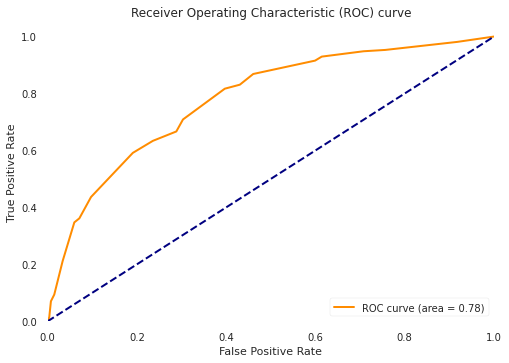

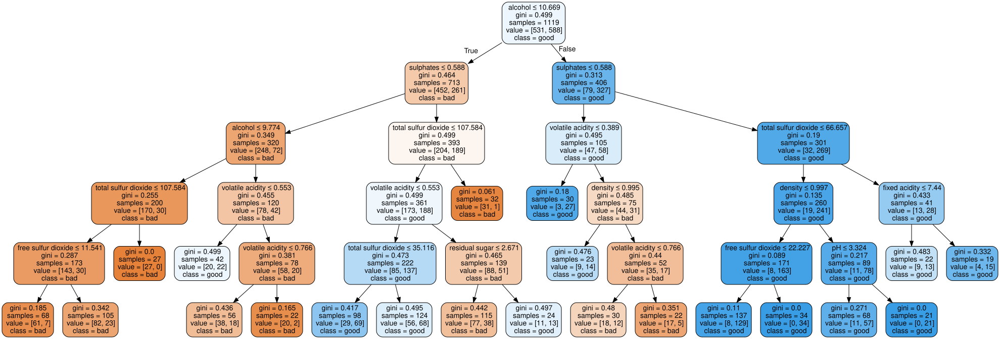

In [34]:
X=kmean_df.to_numpy()
x_train, x_test, y_train, y_test=train_test_split(X, Y, test_size=0.3, random_state=42)
print(x_train.shape, y_train.shape, x_test.shape, y_test.shape)

clf=DecisionTreeClassifier(criterion='gini', max_depth=5, min_samples_leaf=19)
clf.fit(x_train, y_train)
evaluate(clf, x_test, y_test)
dot_data = export_graphviz(clf, out_file=None, feature_names= FEATURES,
                                class_names=second_tree.classes_,  filled=True, rounded=True,  special_characters=True)  
graph = graphviz.Source(dot_data)  
graph

# Reduce number of dimension using PCA

In [35]:
X=df.to_numpy()[:, :-2]
x_train, x_test, y_train, y_test=train_test_split(X, Y, test_size=0.3, random_state=42)
print(x_train.shape, y_train.shape, x_test.shape, y_test.shape)

(1119, 11) (1119,) (480, 11) (480,)


In [36]:
pca=PCA(svd_solver='full')
x_train_pca=pca.fit_transform(x_train)
print(pca.explained_variance_ratio_)

[9.48561286e-01 4.64263108e-02 2.51642763e-03 1.56686004e-03
 8.54121349e-04 3.59942769e-05 1.97718297e-05 9.54972714e-06
 8.45436759e-06 1.22342746e-06 4.76880461e-10]


In [37]:
pca=PCA(n_components=5, svd_solver='full')
x_train_pca=pca.fit_transform(x_train)
x_test_pca=pca.transform(x_test)
print(x_train_pca.shape, x_test_pca.shape)
print(x_train_pca)

(1119, 5) (480, 5)
[[ 3.72612836e+01  2.97724643e+01  7.61626104e-01 -1.37735110e+00
   7.45965153e-01]
 [-3.33720628e+01 -2.95216636e+00  3.68342559e+00 -1.56558808e+00
  -1.14966770e-02]
 [ 2.94754803e+01 -1.04355884e+01 -1.18298119e+00  4.77816720e-01
   8.32340155e-01]
 ...
 [ 3.69661716e+01 -9.02380760e+00 -1.08489169e+00  2.22114035e-01
  -6.19004172e-01]
 [-3.31472206e+01 -1.84416191e+00 -8.10551903e-01 -1.30620680e-01
   1.31503524e+00]
 [-3.79102627e+01 -4.82196943e+00 -2.92820762e+00  9.01590585e-01
   2.68470806e+00]]


Classification report:
              precision    recall  f1-score   support

         bad       0.67      0.63      0.65       213
        good       0.72      0.75      0.73       267

    accuracy                           0.70       480
   macro avg       0.69      0.69      0.69       480
weighted avg       0.70      0.70      0.70       480

Confusion matrix:
[[134  79]
 [ 66 201]]


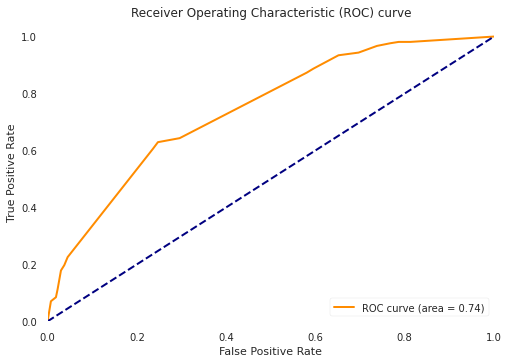

In [40]:
clf=DecisionTreeClassifier(criterion='gini', max_depth=5, min_samples_leaf=19)
clf.fit(x_train_pca, y_train)
evaluate(clf, x_test_pca, y_test)